<a href="https://colab.research.google.com/github/ldockx/my-first-data-engineering-project/blob/visualize-starting-points/first_data_engineering_effort.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Data Extraction
Strava API


In [1]:
import requests
import json
import pandas as pd
import time

# Replace these with your own Strava API credentials
CLIENT_ID = "179478" #client_id
CLIENT_SECRET = "22acdfc6850d9a81a189b4a42d9b4fa8fead0dfb" #client_secret
REFRESH_TOKEN = "99ef40a0681db2d625f1e43531b91d6c516a6949" #refresh_token

# Step 1: Get a new access token using your refresh token
def get_access_token():
    auth_url = "https://www.strava.com/oauth/token"
    payload = {
        "client_id": CLIENT_ID,
        "client_secret": CLIENT_SECRET,
        "refresh_token": REFRESH_TOKEN,
        "grant_type": "refresh_token"
    }
    response = requests.post(auth_url, data=payload)
    response.raise_for_status()
    access_token = response.json()["access_token"]
    return access_token

def get_all_activities(access_token, per_page=200):
    """Retrieve *all* user activities, not just the first page."""
    activities = []
    page = 1
    while True:
        print(f"Fetching page {page}...")
        url = "https://www.strava.com/api/v3/athlete/activities"
        headers = {"Authorization": f"Bearer {access_token}"}
        params = {"per_page": per_page, "page": page}
        response = requests.get(url, headers=headers, params=params)

        if response.status_code != 200:
            print(f"Error {response.status_code}: {response.text}")
            break

        data = response.json()
        if not data:
            print("No more activities found — all data retrieved.")
            break

        activities.extend(data)
        page += 1
        time.sleep(0.2)  # be gentle to Strava's API limits

    return activities

if __name__ == "__main__":
    token = get_access_token()
    activities = get_all_activities(token)#, per_page=200, page=1)

    # Print activities in readable format
    #print(json.dumps(activities, indent=2))
    data = pd.read_json(json.dumps(activities, indent=2))


Fetching page 1...
Fetching page 2...
Fetching page 3...
No more activities found — all data retrieved.


/tmp/ipython-input-285928618.py:57: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  data = pd.read_json(json.dumps(activities, indent=2))


In [ ]:
data.columns

Index(['resource_state', 'athlete', 'name', 'distance', 'moving_time',
       'elapsed_time', 'total_elevation_gain', 'type', 'sport_type',
       'workout_type', 'id', 'start_date', 'start_date_local', 'timezone',
       'utc_offset', 'location_city', 'location_state', 'location_country',
       'achievement_count', 'kudos_count', 'comment_count', 'athlete_count',
       'photo_count', 'map', 'trainer', 'commute', 'manual', 'private',
       'visibility', 'flagged', 'gear_id', 'start_latlng', 'end_latlng',
       'average_speed', 'max_speed', 'has_heartrate', 'average_heartrate',
       'max_heartrate', 'heartrate_opt_out', 'display_hide_heartrate_option',
       'elev_high', 'elev_low', 'upload_id', 'upload_id_str', 'external_id',
       'from_accepted_tag', 'pr_count', 'total_photo_count', 'has_kudoed',
       'average_cadence', 'average_watts', 'max_watts',
       'weighted_average_watts', 'device_watts', 'kilojoules', 'Day', 'Month',
       'Year'],
      dtype='object')

In [2]:
# 1️⃣ Convert start_date to datetime
data["start_date"] = pd.to_datetime(data["start_date"])

#add date columns
data["Day"] = data["start_date"].dt.day
data["Week"] = data["start_date"].dt.isocalendar().week
data["Month"] = data["start_date"].dt.month
data["Year"] = data["start_date"].dt.year

#Visualizing where i moved around the world

In [6]:
import pandas as pd
import folium
from IPython.display import display

# Filter out bad rows (NaN or empty lists)
data = data[data["start_latlng"].apply(lambda x: isinstance(x, list) and len(x) == 2)]

# Split into lat/lon
data[["lat", "lon"]] = pd.DataFrame(data["start_latlng"].tolist(), index=data.index)

# Drop rows with missing values
data = data.dropna(subset=["lat", "lon"])

# Center map
avg_lat = data["lat"].mean()
avg_lon = data["lon"].mean()
m = folium.Map(location=[avg_lat, avg_lon], zoom_start=5)

# Add markers
for _, row in data.iterrows():
    folium.CircleMarker(
        location=[row["lat"], row["lon"]],
        radius=5,
        color="red",
        fill=True,
        fill_color="red"
    ).add_to(m)

# Show map inside notebook
display(m)


#test Heat Map

In [9]:
import requests
import folium
from folium.plugins import HeatMap

# === Strava API credentials ===
CLIENT_ID = "179478"
CLIENT_SECRET = "22acdfc6850d9a81a189b4a42d9b4fa8fead0dfb"
REFRESH_TOKEN = "99ef40a0681db2d625f1e43531b91d6c516a6949"

# === Step 1: Get new access token ===
auth_url = "https://www.strava.com/oauth/token"
auth_payload = {
    "client_id": CLIENT_ID,
    "client_secret": CLIENT_SECRET,
    "refresh_token": REFRESH_TOKEN,
    "grant_type": "refresh_token"
}
res = requests.post(auth_url, data=auth_payload)
res.raise_for_status()
access_token = res.json()["access_token"]

headers = {"Authorization": f"Bearer {access_token}"}

# === Step 2: Get activities ===
activities_url = "https://www.strava.com/api/v3/athlete/activities"
activities_res = requests.get(activities_url, headers=headers, params={"per_page": 200})
activities_res.raise_for_status()
activities = activities_res.json()

all_coords = []

# === Step 3: Extract coordinates for each activity ===
for activity in activities:
    activity_id = activity["id"]
    streams_url = f"https://www.strava.com/api/v3/activities/{activity_id}/streams"
    params = {"keys": "latlng", "key_by_type": "true"}
    streams_res = requests.get(streams_url, headers=headers, params=params)
    streams_res.raise_for_status()
    streams = streams_res.json()

    if "latlng" in streams:
        coords = streams["latlng"]["data"]  # list of [lat, lng]
        all_coords.extend(coords)

print(f"Collected {len(all_coords)} GPS points.")

# === Step 4: Create heatmap ===
if all_coords:
    # Center the map around the first point
    center = all_coords[0]

    m = folium.Map(location=center, zoom_start=12, tiles="CartoDB dark_matter")
    HeatMap(all_coords, radius=6, blur=10, min_opacity=0.4).add_to(m)

    # Save to file
    m.save("strava_heatmap.html")
    print("✅ Heatmap saved as strava_heatmap.html")
    display(m)
else:
    print("No GPS points found.")


Collected 698080 GPS points.
✅ Heatmap saved as strava_heatmap.html


#(Over)Writing Data to google drive

In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Step 2: Create a sample DataFrame
import pandas as pd

df = data

# Step 3: Define path in Drive (e.g., inside ColabProjects/experiment1/)
import os

folder_path = '/content/drive/MyDrive/Data/Strava-API'
os.makedirs(folder_path, exist_ok=True)  # Create folder if it doesn’t exist

file_path = os.path.join(folder_path, 'strava_data.csv')

# Step 4: Save DataFrame (this will overwrite if file already exists)
df.to_csv(file_path, index=False)

print(f"✅ DataFrame saved (or overwritten) at: {file_path}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ DataFrame saved (or overwritten) at: /content/drive/MyDrive/Data/Strava-API/strava_data.csv


#Avg Number of Kudos


##Sport Type

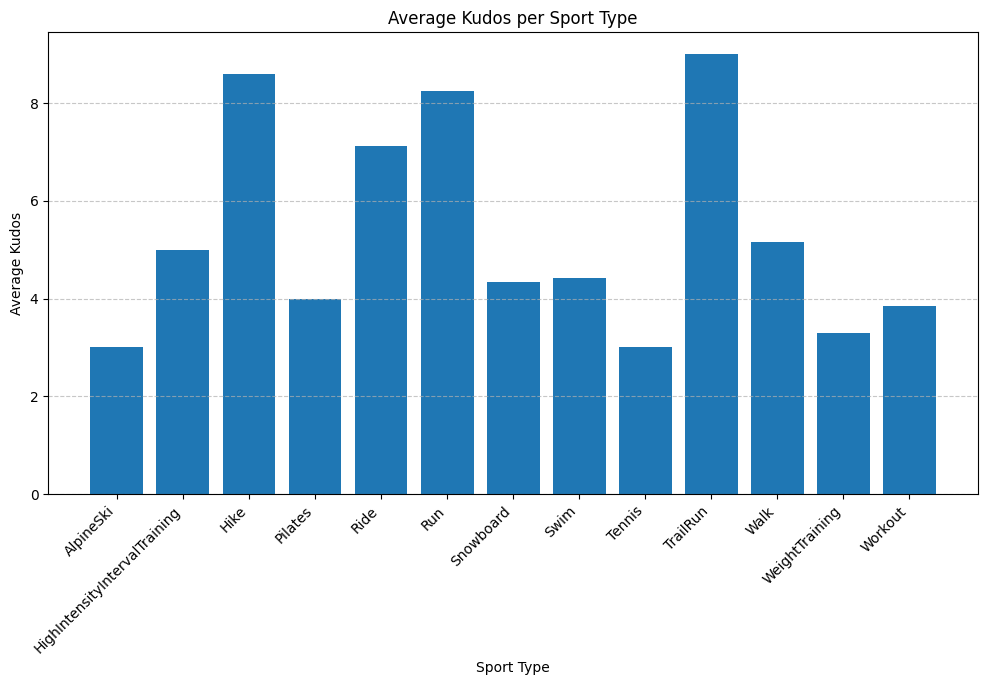

In [ ]:
import matplotlib.pyplot as plt

# Compute average kudos per sport
average_kudos = data.groupby("sport_type")["kudos_count"].mean()

# Create a larger figure (width=12 inches, height=6 inches)
plt.figure(figsize=(12, 6))

# Plot the bar chart
plt.bar(average_kudos.index, average_kudos.values)

# Add labels and title
plt.xlabel("Sport Type")
plt.ylabel("Average Kudos")
plt.title("Average Kudos per Sport Type")

# Rotate x-axis labels if there are many or long names
plt.xticks(rotation=45, ha='right')

# Add grid for readability (optional)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the chart
plt.show()


##Timeline

/tmp/ipython-input-3925012924.py:3: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  data['year_month'] = data['start_date'].dt.to_period('M').astype(str)


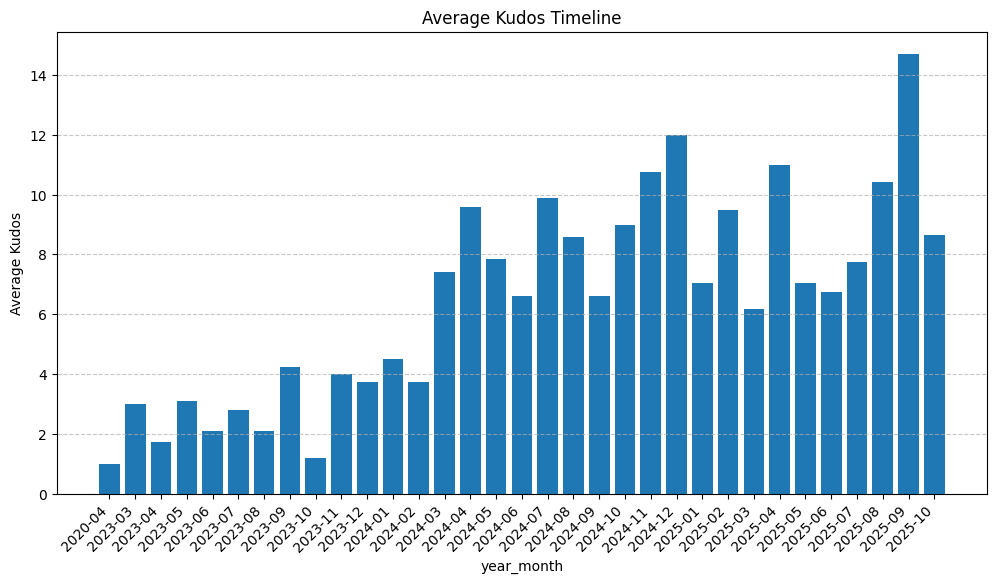

In [ ]:
import matplotlib.pyplot as plt

data['year_month'] = data['start_date'].dt.to_period('M').astype(str)

# Compute average kudos per sport
average_kudos = data.groupby("year_month")["kudos_count"].mean()

# Create a larger figure (width=12 inches, height=6 inches)
plt.figure(figsize=(12, 6))

# Plot the bar chart
plt.bar(average_kudos.index, average_kudos.values)

# Add labels and title
plt.xlabel("year_month")
plt.ylabel("Average Kudos")
plt.title("Average Kudos Timeline")

# Rotate x-axis labels if there are many or long names
plt.xticks(rotation=45, ha='right')

# Add grid for readability (optional)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the chart
plt.show()


#Running Distance Timeline

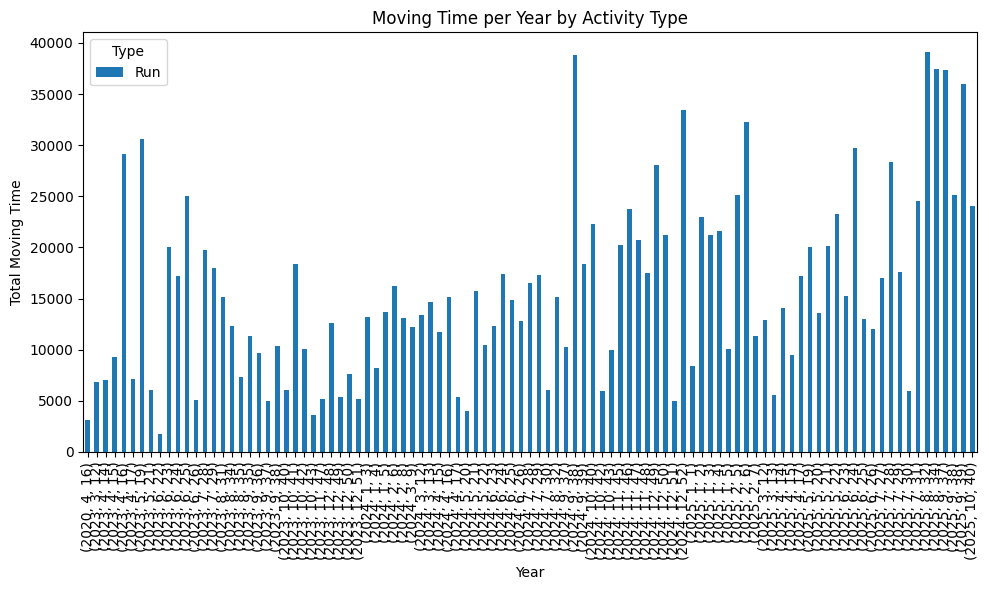

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# 1️⃣ Group data by Month and Type, summing distance
grouped = data[data["sport_type"] == "Run"].groupby(["Year", "Month", "Week", "type"])["distance"].sum().unstack(fill_value=0)

# 2️⃣ Plot stacked bar chart
grouped.plot(kind="bar", stacked=True, figsize=(10,6))

# 3️⃣ Customize chart
plt.title("Moving Time per Year by Activity Type")
plt.xlabel("Year")
plt.ylabel("Total Moving Time")
plt.legend(title="Type")
plt.tight_layout()
plt.show()


In [ ]:
grouped

type                 Run
Year Month Week         
2020 4     16     3131.6
2023 3     12     6837.9
     4     14     7013.9
           15     9250.8
           16    29148.9
...                  ...
2025 8     34    37488.3
     9     37    37337.0
           38    25101.1
           39    36025.3
     10    40    24082.6

[99 rows x 1 columns]

#Moving Time Timeline

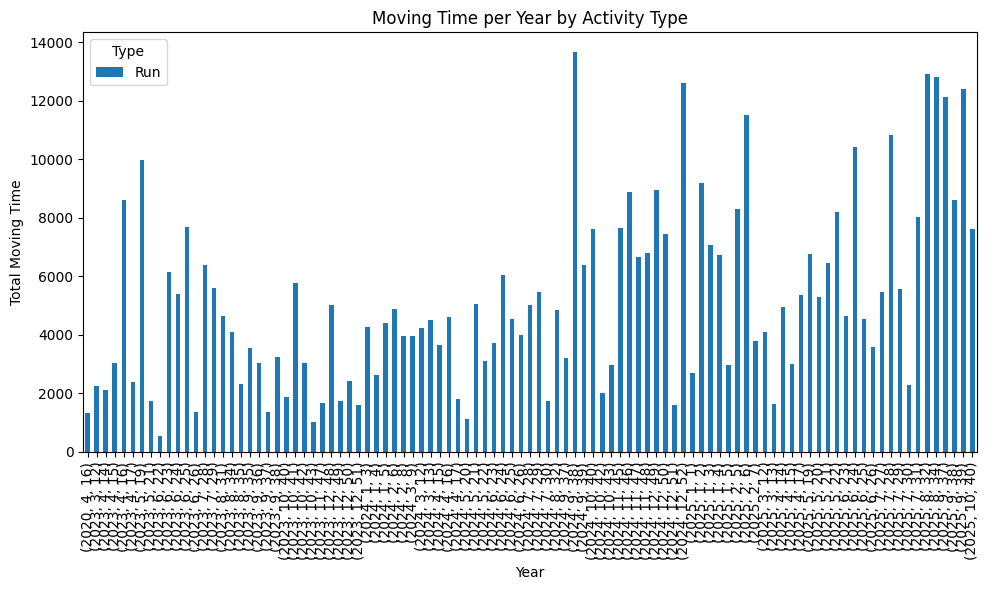

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Example assumes your DataFrame has at least these columns:
# 'Month', 'distance', and 'type'

# 1️⃣ Group data by Month and Type, summing distance
grouped = data[data["sport_type"] == "Run"].groupby(["Year", "Month", "Week", "type"])["moving_time"].sum().unstack(fill_value=0)

# 2️⃣ Plot stacked bar chart
grouped.plot(kind="bar", stacked=True, figsize=(10,6))

# 3️⃣ Customize chart
plt.title("Moving Time per Year by Activity Type")
plt.xlabel("Year")
plt.ylabel("Total Moving Time")
plt.legend(title="Type")
plt.tight_layout()
plt.show()


#Condition Progress

/tmp/ipython-input-4193770182.py:6: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  data['year_month'] = data['start_date'].dt.to_period('M').astype(str)


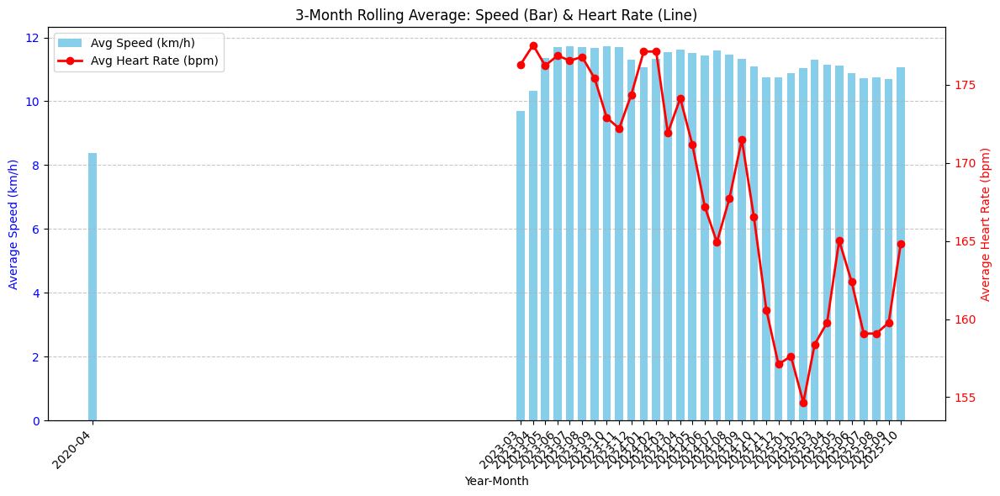

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# --- Ensure date formatting ---
data['start_date'] = pd.to_datetime(data['start_date'])
data['year_month'] = data['start_date'].dt.to_period('M').astype(str)

# --- Aggregate by month ---
avg_hr = data[data["sport_type"] == "Run"].groupby("year_month")["average_heartrate"].mean()
avg_speed = data[data["sport_type"] == "Run"].groupby("year_month")["average_speed"].mean()*3.6 #to convert to km/h

# --- Combine both into one DataFrame ---
combined = pd.concat([avg_hr, avg_speed], axis=1)
combined.columns = ['average_heartrate', 'average_speed']

# --- Convert index to datetime for rolling calculation ---
combined.index = pd.to_datetime(combined.index)

# --- Apply 6-month rolling average ---
combined_rolled = combined.rolling(window=3, min_periods=1).mean()

# --- Create figure and dual axes ---
fig, ax1 = plt.subplots(figsize=(12, 6))

# --- Bar chart: Average Speed ---
ax1.bar(
    combined_rolled.index,
    combined_rolled['average_speed'],
    color='skyblue',
    width=20,          # widen bars (days)
    label='Avg Speed (km/h)'
)
ax1.set_xlabel("Year-Month")
ax1.set_ylabel("Average Speed (km/h)", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# --- Second axis: Line chart for Heart Rate ---
ax2 = ax1.twinx()
ax2.plot(
    combined_rolled.index,
    combined_rolled['average_heartrate'],
    color='red',
    marker='o',
    linewidth=2,
    label='Avg Heart Rate (bpm)'
)
ax2.set_ylabel("Average Heart Rate (bpm)", color='red')
ax2.tick_params(axis='y', labelcolor='red')

# --- Formatting ---
plt.title("3-Month Rolling Average: Speed (Bar) & Heart Rate (Line)")
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.set_xticks(combined_rolled.index)
ax1.set_xticklabels(combined_rolled.index.strftime('%Y-%m'), rotation=45, ha='right')

# --- Combine legends from both axes ---
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper left')

plt.tight_layout()
plt.show()




#Marathon Prediction

In [ ]:
#check how many run activities i have on my strava app
data[data["type"] == "Run"].shape[0]

170

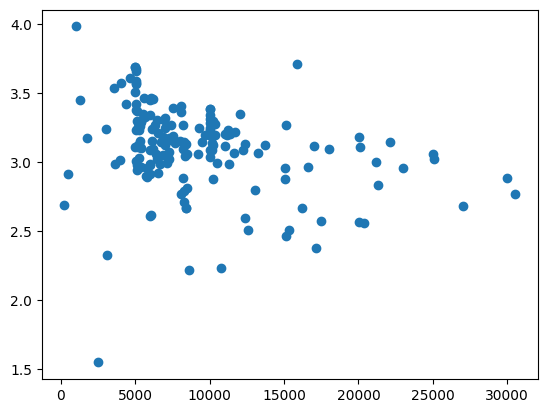

In [ ]:
run_activities = data[data["type"] == "Run"]

activity_speed = run_activities["distance"] / run_activities["moving_time"]

plt.scatter(run_activities["distance"],activity_speed)

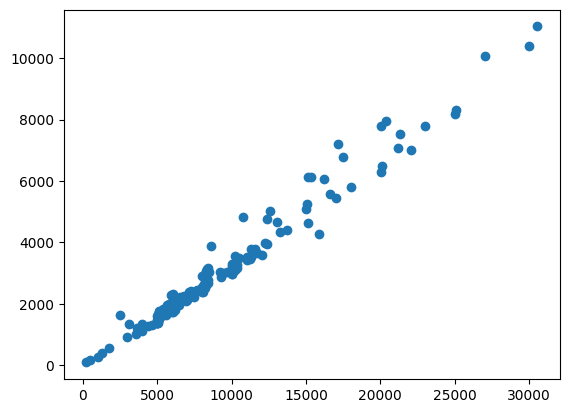

In [ ]:
plt.scatter(run_activities["distance"], run_activities["moving_time"])